# Simple plotting options for the full ApRES data
1. compute dB from stacked profiles, coarsen, and show as a depth-time plot
2. zoom in on a a shorter time period
3. look at individual stacked profiles
4. look at individual profiles from a given burst

This notebook is best run from a cloud-based server, such as [CryoCloud](https://hub.cryointhecloud.com/hub/). 

In [1]:
import xarray as xr
import numpy as np
import hvplot.xarray
import matplotlib.pyplot as plt
import sys
sys.path.append("../../../xapres/")
import xapres as xa

The ApRES data we will be using were collected in the ablation zone of the Greenland Ice Sheet by a team led by Meredith Nettles (Lamont-Doherty Earth Observatory, LDEO) and Laura Stevens (University of Oxford), including George Lu (LDEO), Stacy Larochelle (LDEO), Marianne Okal (Earthscope), Kristin Arnold (IRIS Alpine), and Josh Rines (Stanford University). The project was funded by the US National Science Foundation (project number: 2003464). Three ApRES units were positioned near several supraglacial lakes that periodically drain to the bed of the ice sheet. The units collected a burst every 15 minutes for up to 18 months.

Details on how these data were gathered together in xarrays and stored as zarrs in a cloud bucket can be found [here](https://book.cryointhecloud.com/tutorials/ARCOdata_writingZarrs.html).

Lazily load the data from one of the units, named A101.

In [2]:
A101 = xa.load.load_zarr()

Take a look at the whole dataset and see how large it is

In [3]:
print(f"{A101.nbytes/1e9} GB")
A101

202.513838596 GB


<xarray.Dataset> Size: 203GB
Dimensions:          (attenuator_setting_pair: 2, time: 11723,
                      chirp_time: 40001, chirp_num: 20, profile_range: 6658)
Coordinates:
    AFGain           (attenuator_setting_pair) int64 16B dask.array<chunksize=(2,), meta=np.ndarray>
    attenuator       (attenuator_setting_pair) float64 16B dask.array<chunksize=(2,), meta=np.ndarray>
    burst_number     (time) int64 94kB dask.array<chunksize=(1,), meta=np.ndarray>
  * chirp_num        (chirp_num) int64 160B 0 1 2 3 4 5 6 ... 14 15 16 17 18 19
  * chirp_time       (chirp_time) timedelta64[ns] 320kB 00:00:00 ... 00:00:01
    filename         (time) <U83 4MB dask.array<chunksize=(1,), meta=np.ndarray>
  * profile_range    (profile_range) float64 53kB 0.0 0.2103 ... 1.4e+03 1.4e+03
  * time             (time) datetime64[ns] 94kB 2022-05-22T19:40:20 ... 2022-...
Dimensions without coordinates: attenuator_setting_pair
Data variables:
    battery_voltage  (time) float64 94kB dask.array<chunksize=(20,), meta=np.ndarray>
    chirp            (time, chirp_time, chirp_num, attenuator_setting_pair) float64 150GB dask.array<chunksize=(20, 40001, 20, 2), meta=np.ndarray>
    latitude         (time) float64 94kB dask.array<chunksize=(20,), meta=np.ndarray>
    longitude        (time) float64 94kB dask.array<chunksize=(20,), meta=np.ndarray>
    profile          (time, profile_range, chirp_num, attenuator_setting_pair) complex128 50GB dask.array<chunksize=(20, 6658, 20, 2), meta=np.ndarray>
    profile_stacked  (time, profile_range, attenuator_setting_pair) complex128 2GB dask.array<chunksize=(20, 6658, 2), meta=np.ndarray>
    temperature_1    (time) float64 94kB dask.array<chunksize=(20,), meta=np.ndarray>
    temperature_2    (time) float64 94kB dask.array<chunksize=(20,), meta=np.ndarray>

Start a dask cluster (get this cell by clicking in the menus on the left. 

In [5]:
from dask.distributed import Client

client = Client("tcp://127.0.0.1:39085")
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 4
Total threads: 8,Total memory: 24.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:50092,Workers: 4
Dashboard: http://127.0.0.1:8787/status,Total threads: 8
Started: Just now,Total memory: 24.00 GiB
Comm: tcp://127.0.0.1:50107,Total threads: 2
Dashboard: http://127.0.0.1:50110/status,Memory: 6.00 GiB
Nanny: tcp://127.0.0.1:50095,


## 1. Compute dB from stacked profiles, coarsen, and show as a depth-time plot


Coarsen the data so that we can view the whole thing in a plot. The coordinate filename causes issues here so delete it first.

In [6]:
del A101['filename']

In [10]:
coarse_0 = A101.profile_stacked.dB().isel(time=slice(15,None), attenuator_setting_pair=0).coarsen(time=20, profile_range=20, boundary='trim').mean()
coarse_0

<xarray.DataArray 'profile_stacked' (time: 585, profile_range: 332)> Size: 2MB
dask.array<mean_agg-aggregate, shape=(585, 332), dtype=float64, chunksize=(1, 332), chunktype=numpy.ndarray>
Coordinates:
    AFGain         int64 8B dask.array<chunksize=(), meta=np.ndarray>
    attenuator     float64 8B dask.array<chunksize=(), meta=np.ndarray>
    burst_number   (time) float64 5kB dask.array<chunksize=(1,), meta=np.ndarray>
  * profile_range  (profile_range) float64 3kB 1.998 6.204 ... 1.394e+03
  * time           (time) datetime64[ns] 5kB 2022-05-26T18:14:02.400000 ... 2...

We can see that this is going to produce an array that is only 1.5 MB, so this shouldnt cause us any issues with memory. Let's compute it and bring the result into the notebook memory using `.compute()`

In [9]:
coarse_0.compute()

<xarray.DataArray 'profile_stacked' (time: 4, profile_range: 332)> Size: 11kB
array([[ -70.2938693 ,  -60.13797292,  -45.08525446, ..., -100.08331213,
        -101.86960822,  -98.94555037],
       [ -70.72341273,  -58.94453656,  -43.15540881, ...,  -99.63047502,
        -101.9568462 ,  -99.55674411],
       [ -70.52693649,  -58.98579078,  -42.29855299, ...,  -99.27645964,
        -100.3453545 ,  -98.13217947],
       [ -70.52578329,  -58.94442704,  -42.1436291 , ...,  -98.7062613 ,
        -101.12516437,  -97.83188733]])
Coordinates:
    AFGain         int64 8B -4
    attenuator     float64 8B 5.0
    burst_number   (time) float64 32B 10.5 30.5 50.5 70.5
  * profile_range  (profile_range) float64 3kB 1.998 6.204 ... 1.394e+03
  * time           (time) datetime64[ns] 32B 2022-05-26T18:14:02.400000 ... 2...

Then plot the result with hvplot

In [13]:
coarse_0.hvplot(width = 800, height = 800)

:Image   [time,profile_range]   (profile_stacked)

## 2. Zoom in on a a shorter time period
The period around July 14th looks interesting. So let's zoom in on that area and try to plot a full-resolutiopn version.

We can use `.sel` and `slice` to select a range. (we will also restrict ourselves to the first attenuator setting pair)

In [26]:
mid_july = A101.profile_stacked.dB().sel(time = slice('2022-07-13 12:00','2022-07-15 00:00')).isel(attenuator_setting_pair=0)

To check that we successfully subsetted the data we can look at the timestampe of the first and the last entries in `min_july`:

In [27]:
print(f'The first timestamp is {mid_july.time[0].values}')
print(f'The last timestamp is {mid_july.time[-1].values}')

The first timestamp is 2022-07-13T12:06:57.000000000
The last timestamp is 2022-07-14T23:51:50.000000000


These are approximately the times we asked for. It is only approximate because it chooses the nearest data from dB. 

We should check how large the data is before we attempt to load it into memory (which has to happen if we are going to plot it!).

In [32]:
print(f"{mid_july.nbytes/1e6} MB")

7.670016 MB


This is small enough not to be a problem, so let's load it into memory for easy plotting:

In [33]:
mid_july.load()

<xarray.DataArray 'profile_stacked' (time: 144, profile_range: 6658)>
array([[ -39.63746671,  -73.10729928,  -44.99570423, ..., -107.97599066,
        -111.9413998 , -103.85520082],
       [ -39.51178009,  -69.96029657,  -44.96689668, ...,  -91.36564366,
        -110.54234408, -112.04223736],
       [ -39.43060346,  -68.99938981,  -44.8418203 , ...,  -93.02684048,
        -107.28531239,  -95.44452736],
       ...,
       [ -39.52048169,  -79.32603353,  -44.20597757, ..., -106.34302346,
        -105.36358558, -116.44678093],
       [ -39.49367375,  -77.82615236,  -44.19744537, ...,  -99.05443507,
        -104.34951215, -102.00647638],
       [ -39.46715434,  -75.92302456,  -44.22403478, ...,  -99.66778   ,
        -107.38694507, -111.13425693]])
Coordinates:
    AFGain         int64 -4
    attenuator     float64 5.0
    burst_number   (time) int64 82 83 84 85 86 87 88 89 ... 31 32 33 34 35 36 37
  * profile_range  (profile_range) float64 0.0 0.2103 0.4206 ... 1.4e+03 1.4e+03
  * time           (time) datetime64[ns] 2022-07-13T12:06:57 ... 2022-07-14T2...

Then plot it using hvplot.

In [35]:
mid_july.hvplot(width = 800, height = 800)

:Image   [time,profile_range]   (profile_stacked)

# 3. look at individual stacked profiles

Zooming around manually in the plot suggests a very abrupt change around 2022-07-14 02:45. We can extract individual staked profiles from around that time and plot them. 

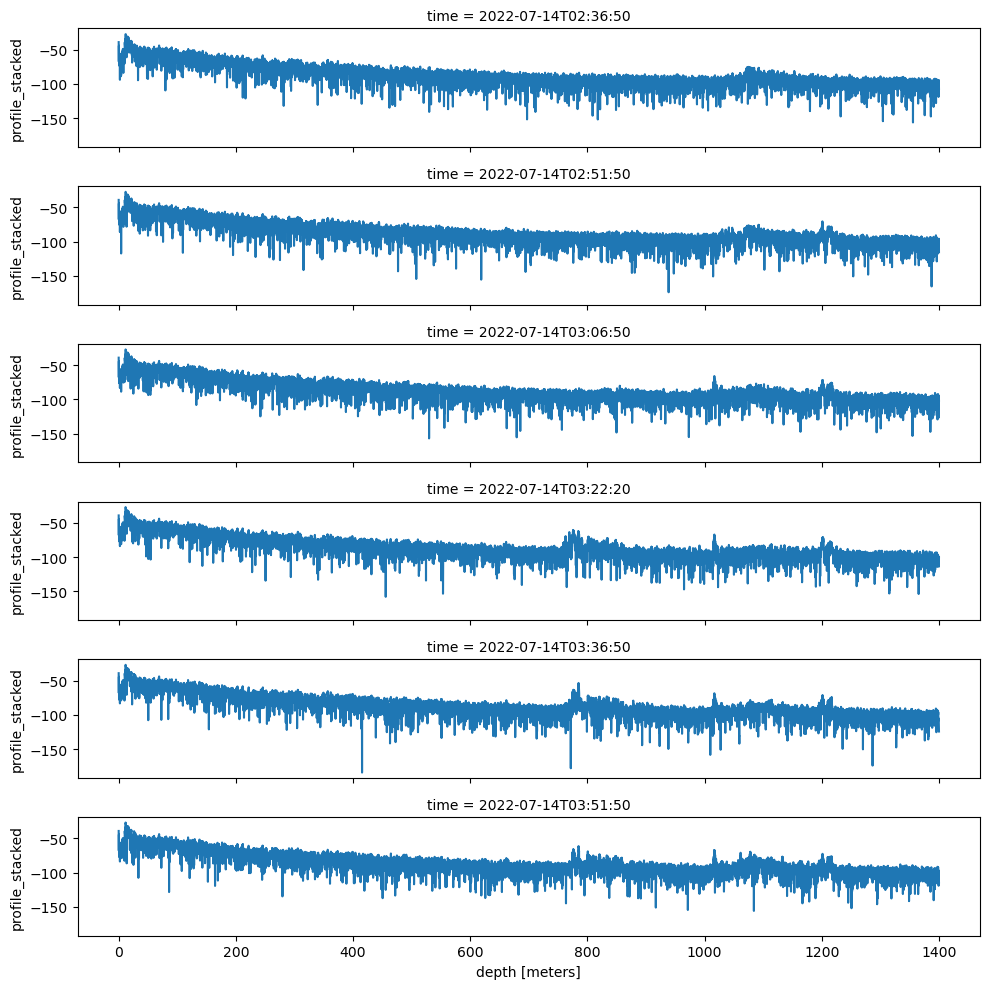

In [57]:
list_of_times = ['2022-07-14 02:35',
                 '2022-07-14 02:50',
                 '2022-07-14 03:05',
                 '2022-07-14 03:20',
                 '2022-07-14 03:35',
                 '2022-07-14 03:50'
                ]


profiles = mid_july.sel(time=list_of_times, method = 'nearest')
profiles.plot(row='time', figsize=(10,10))

To take a closer look at the onset of the bright reflectors around 800 m we can set the limits as follows

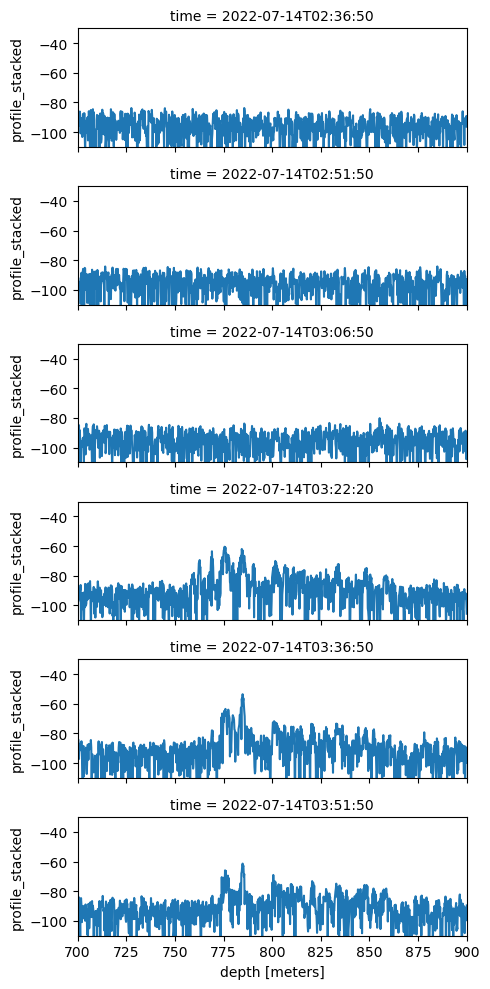

In [58]:
profiles.plot(row='time', figsize=(5,10), xlim=(700,900), ylim=(-110,-30))

## 4. look at individual profiles from a given burst

To check the consistency of the chirps and profiles during these changes we can plot the individual chirps and profiles for a time before and after this change

In [60]:
profiles_unstacked = A101.profile.sel(time=list_of_times, method = 'nearest')
dB_unstacked = profiles_unstacked.dB().persist()

## Before the change

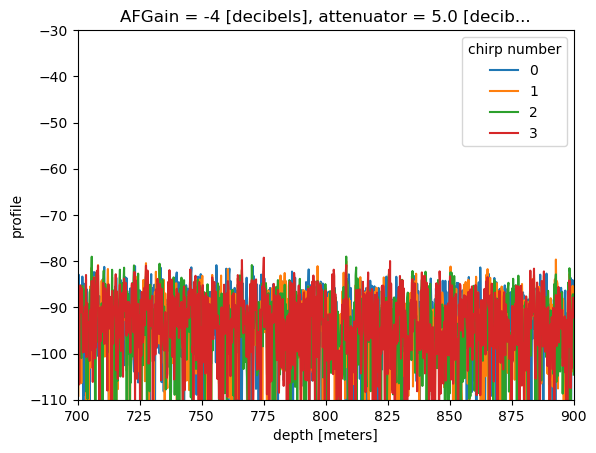

In [70]:
dB_unstacked.isel(time = 0, chirp_num = [0,1,2,3], attenuator_setting_pair = 0).plot.line(x='profile_range', xlim=(700,900), ylim=(-110,-30));

### After the change

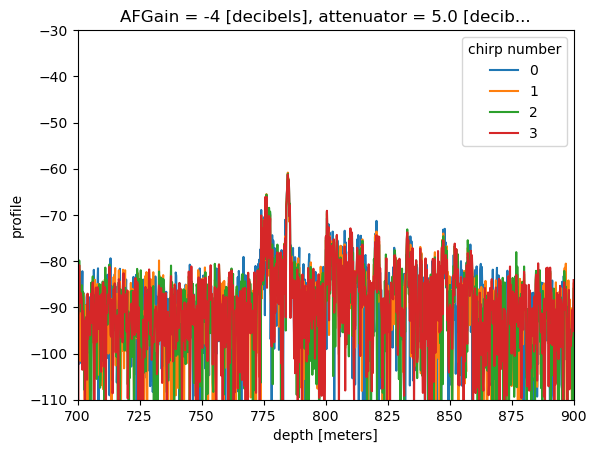

In [72]:
dB_unstacked.isel(time = -1, chirp_num = [0,1,2,3], attenuator_setting_pair = 0).plot.line(x='profile_range', xlim=(700,900), ylim=(-110,-30));

#### Also plot the chirps

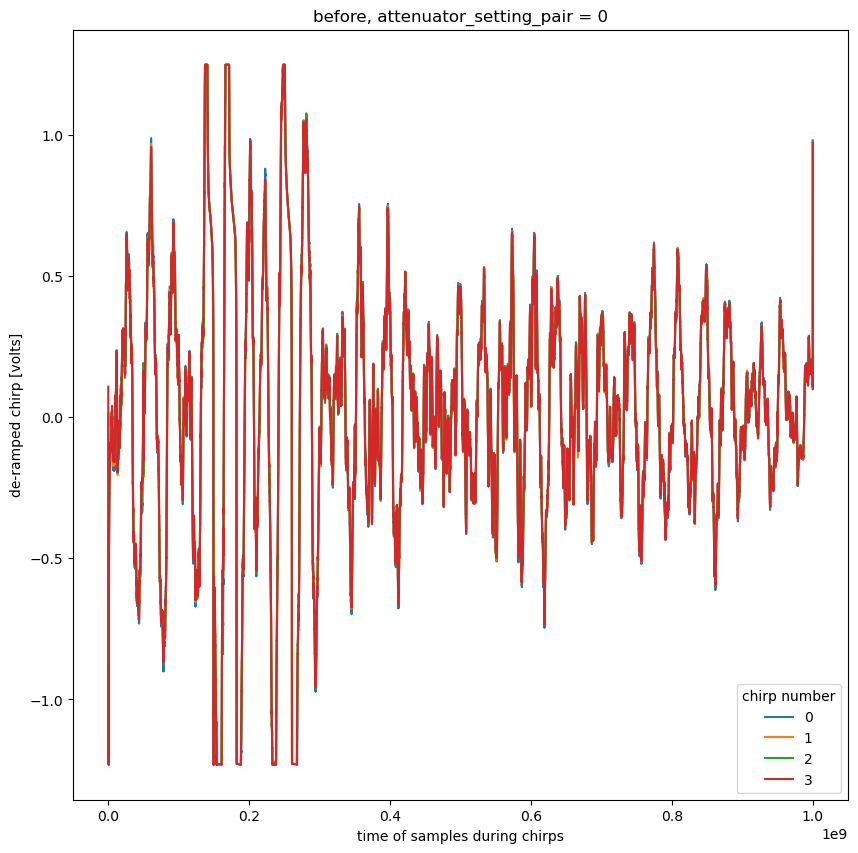

In [108]:
chirps_unstacked = A101.chirp.sel(time=[list_of_times[i] for i in [0, -1]], method = 'nearest')

chirps_unstacked.isel(time = 0, chirp_num = [0,1,2,3], attenuator_setting_pair = 0).plot.line(x='chirp_time', figsize = (10,10));
plt.title('before, attenuator_setting_pair = 0');

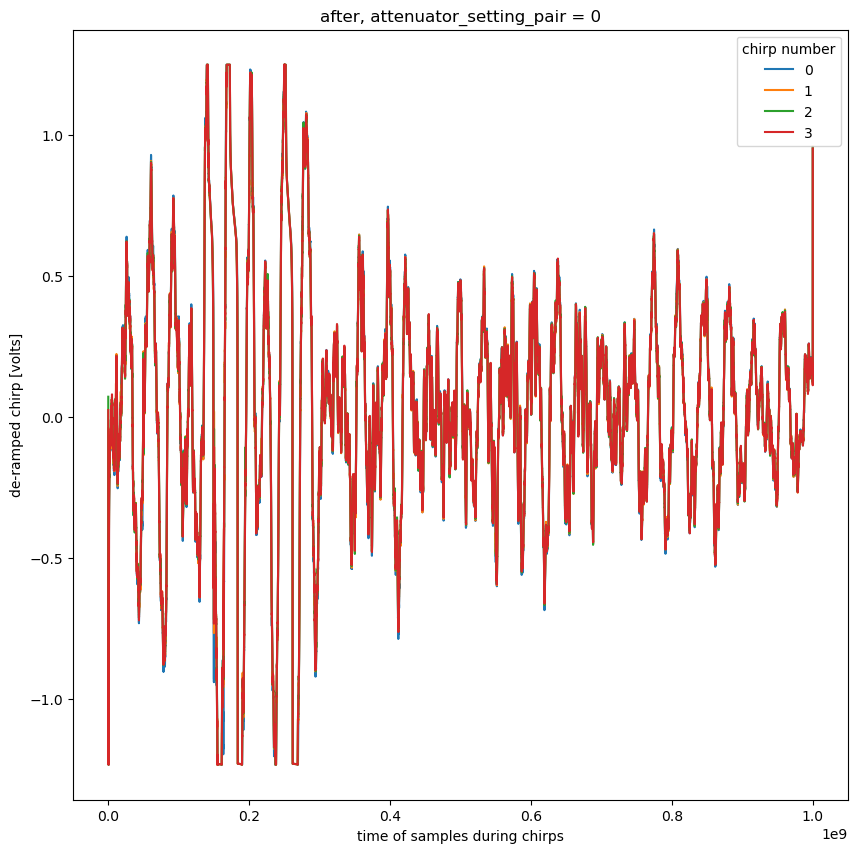

In [109]:
chirps_unstacked.isel(time = -1, chirp_num = [0,1,2,3], attenuator_setting_pair = 0).plot.line(x='chirp_time', figsize = (10,10));
plt.title('after, attenuator_setting_pair = 0');

There appears to be some clipping here. So we can check the other attenuator setting pair, which is more attenuated:

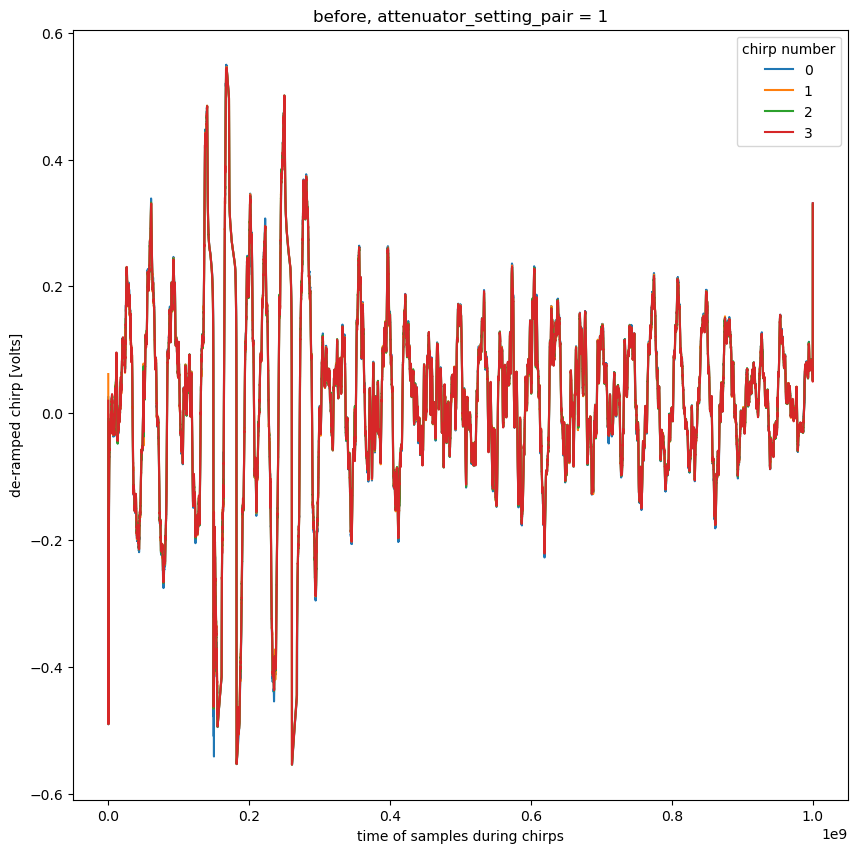

In [110]:
chirps_unstacked.isel(time = 0, chirp_num = [0,1,2,3], attenuator_setting_pair = 1).plot.line(x='chirp_time', figsize = (10,10));
plt.title('before, attenuator_setting_pair = 1');

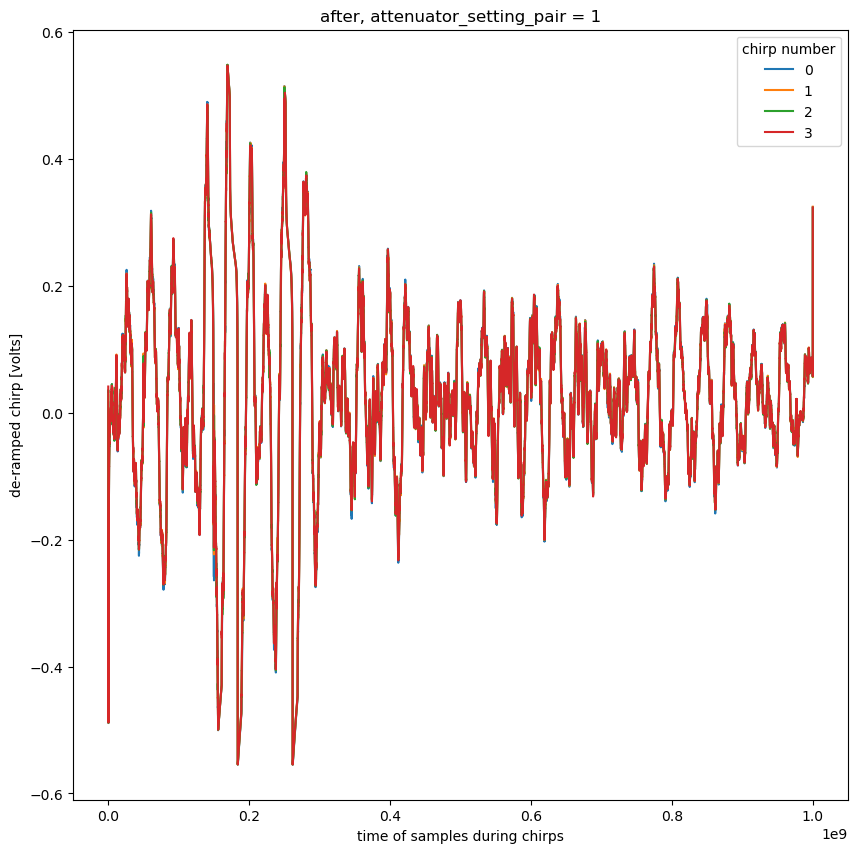

In [111]:
chirps_unstacked.isel(time = -1, chirp_num = [0,1,2,3], attenuator_setting_pair = 1).plot.line(x='chirp_time', figsize = (10,10));
plt.title('after, attenuator_setting_pair = 1');